Rendering healing-engine GIF...
Rendering eco-benchmark GIF...
Rendering asi-safeguards GIF...
Displaying Ecology, Healing & Resilience Trio...



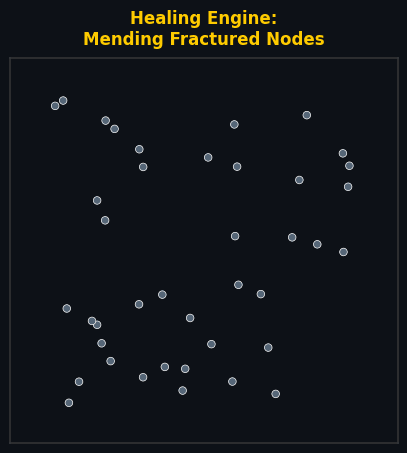
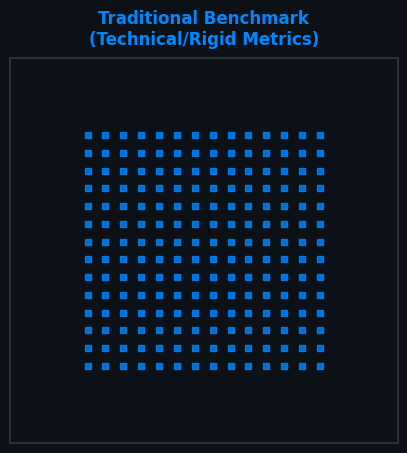
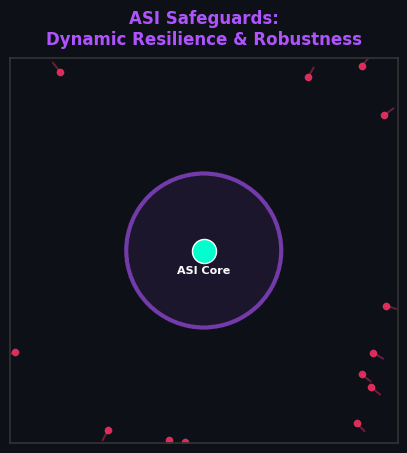

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import io
import base64
from IPython.display import display, HTML
import warnings

# Suppress warnings for clean output
warnings.filterwarnings("ignore")

# ---------------------------------------------------------
# Configuration
# ---------------------------------------------------------
FRAMES = 90
FPS = 30
BG_COLOR = "#0d1117"  # GitHub Dark
ACCENT_1 = "#00ffcc"  # ASI Cyan
ACCENT_2 = "#ff3366"  # Danger/Noise Red
ACCENT_3 = "#b055ff"  # Latent Purple
ACCENT_GOLD = "#ffcc00" # Healing/Kintsugi Gold
ACCENT_ECO = "#00ff77"  # Ecology Green

# Set global Seaborn dark theme
sns.set_theme(style="darkgrid", rc={
    "axes.facecolor": BG_COLOR,
    "figure.facecolor": BG_COLOR,
    "axes.edgecolor": "#333333",
    "grid.color": "#222222",
    "text.color": "#e0e0e0",
    "xtick.color": "#e0e0e0",
    "ytick.color": "#e0e0e0"
})

def fig_to_image(fig):
    buf = io.BytesIO()
    fig.savefig(buf, format='png', bbox_inches='tight', facecolor=fig.get_facecolor(), dpi=100)
    buf.seek(0)
    return Image.open(buf).copy()

# ---------------------------------------------------------
# Visualizer 1: healing-engine
# ---------------------------------------------------------
def generate_healing_engine_gif(filename):
    print("Rendering healing-engine GIF...")
    frames = []

    np.random.seed(42)
    n_nodes = 40

    x_init = np.random.uniform(-4, 4, n_nodes)
    y_init = np.random.uniform(-4, 4, n_nodes)

    angles = np.linspace(0, 2*np.pi, n_nodes, endpoint=False)
    x_target = 2.5 * np.cos(angles)
    y_target = 2.5 * np.sin(angles)

    fig, ax = plt.subplots(figsize=(5, 5))

    for i in range(FRAMES):
        ax.clear()
        p = i / (FRAMES - 1)
        ease_p = 1 - (1 - p)**3

        curr_x = x_init + (x_target - x_init) * ease_p
        curr_y = y_init + (y_target - y_init) * ease_p

        for j in range(n_nodes):
            for k in range(j+1, n_nodes):
                dist = np.sqrt((curr_x[j]-curr_x[k])**2 + (curr_y[j]-curr_y[k])**2)
                if dist < 1.5 + (ease_p * 0.5):
                    alpha_val = np.clip(min(0.6, (1.5 - dist) * ease_p), 0, 0.6)
                    ax.plot([curr_x[j], curr_x[k]], [curr_y[j], curr_y[k]], color=ACCENT_GOLD, linewidth=1, alpha=alpha_val, zorder=1)

        node_colors = []
        for j in range(n_nodes):
            dist_to_target = np.sqrt((curr_x[j]-x_target[j])**2 + (curr_y[j]-y_target[j])**2)
            heal_ratio = max(0, 1 - (dist_to_target / 3.0))
            color = ACCENT_GOLD if heal_ratio > 0.8 else "#556677"
            node_colors.append(color)

        ax.scatter(curr_x, curr_y, c=node_colors, s=30 + (ease_p * 20), edgecolors="white", linewidths=0.5, zorder=3)

        core_glow = plt.Circle((0, 0), ease_p * 2.2, color=ACCENT_ECO, fill=True, alpha=max(0, ease_p * 0.15), zorder=0)
        ax.add_patch(core_glow)

        ax.set_xlim(-5, 5)
        ax.set_ylim(-5, 5)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title("Healing Engine:\nMending Fractured Nodes", color=ACCENT_GOLD, pad=10, fontweight='bold')

        frames.append(fig_to_image(fig))

    plt.close(fig)
    frames[0].save(filename, save_all=True, append_images=frames[1:], duration=int(1000/FPS), loop=0)
    return filename

# ---------------------------------------------------------
# Visualizer 2: eco-benchmark
# ---------------------------------------------------------
def generate_eco_benchmark_gif(filename):
    print("Rendering eco-benchmark GIF...")
    frames = []

    n_points = 196
    grid_side = 14
    x_grid = np.linspace(-3, 3, grid_side)
    y_grid = np.linspace(-3, 3, grid_side)
    X, Y = np.meshgrid(x_grid, y_grid)
    x_init = X.flatten()
    y_init = Y.flatten()

    golden_angle = np.pi * (3 - np.sqrt(5))
    radii = np.sqrt(np.arange(n_points)) / np.sqrt(n_points) * 4
    angles = np.arange(n_points) * golden_angle
    x_target = radii * np.cos(angles)
    y_target = radii * np.sin(angles)

    fig, ax = plt.subplots(figsize=(5, 5))

    for i in range(FRAMES):
        ax.clear()
        p = i / (FRAMES - 1)
        ease_p = p**2 * (3 - 2*p)

        curr_x = x_init + (x_target - x_init) * ease_p
        curr_y = y_init + (y_target - y_init) * ease_p

        sizes = 10 + (radii * 10 * ease_p)

        if p < 0.4:
            ax.scatter(curr_x, curr_y, color="#0088ff", s=15, alpha=0.8, marker="s")
            title = "Traditional Benchmark\n(Technical/Rigid Metrics)"
            t_color = "#0088ff"
        else:
            ax.scatter(curr_x, curr_y, color=ACCENT_ECO, s=sizes, alpha=0.8 + (0.2*ease_p), edgecolors=ACCENT_1, linewidths=0.5)
            title = "Eco-Benchmark\n(Societal & Planetary Flourishing)"
            t_color = ACCENT_ECO

        ax.set_xlim(-5, 5)
        ax.set_ylim(-5, 5)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title(title, color=t_color, pad=10, fontweight='bold')

        frames.append(fig_to_image(fig))

    plt.close(fig)
    frames[0].save(filename, save_all=True, append_images=frames[1:], duration=int(1000/FPS), loop=0)
    return filename

# ---------------------------------------------------------
# Visualizer 3: asi-safeguards
# ---------------------------------------------------------
def generate_safeguards_gif(filename):
    print("Rendering asi-safeguards GIF...")
    frames = []

    np.random.seed(101)
    n_attacks = 60

    angles = np.random.uniform(0, 2*np.pi, n_attacks)
    start_radii = np.random.uniform(5, 8, n_attacks)
    speeds = np.random.uniform(0.1, 0.2, n_attacks)

    fig, ax = plt.subplots(figsize=(5, 5))
    shield_radius = 2.0

    for i in range(FRAMES):
        ax.clear()
        core_pulse = np.sin(i * 0.2) * 0.1
        ax.scatter(0, 0, color=ACCENT_1, s=300 + (core_pulse*50), edgecolors="white", zorder=5)
        ax.text(0, -0.6, "ASI Core", color="white", ha="center", fontsize=8, fontweight="bold", zorder=6)

        shield = plt.Circle((0, 0), shield_radius, color=ACCENT_3, fill=False, linewidth=3, alpha=0.6)
        ax.add_patch(shield)
        shield_glow = plt.Circle((0, 0), shield_radius, color=ACCENT_3, fill=True, alpha=0.1)
        ax.add_patch(shield_glow)

        for j in range(n_attacks):
            start_radii[j] -= speeds[j]
            curr_r = start_radii[j]
            curr_x = curr_r * np.cos(angles[j])
            curr_y = curr_r * np.sin(angles[j])

            if curr_r > shield_radius:
                ax.scatter(curr_x, curr_y, color=ACCENT_2, s=20, alpha=0.8)
                ax.plot([curr_x, (curr_r+0.3)*np.cos(angles[j])], [curr_y, (curr_r+0.3)*np.sin(angles[j])], color=ACCENT_2, alpha=0.4)
            elif curr_r > 0:
                speeds[j] = -speeds[j] * 0.5
                ax.scatter(curr_x, curr_y, color=ACCENT_1, s=10, alpha=max(0, curr_r/shield_radius))
                ax.scatter(curr_x, curr_y, color="white", s=50, alpha=0.6, zorder=4)

        ax.set_xlim(-5, 5)
        ax.set_ylim(-5, 5)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title("ASI Safeguards:\nDynamic Resilience & Robustness", color=ACCENT_3, pad=10, fontweight='bold')

        frames.append(fig_to_image(fig))

    plt.close(fig)
    frames[0].save(filename, save_all=True, append_images=frames[1:], duration=int(1000/FPS), loop=0)
    return filename

# ---------------------------------------------------------
# Execution & Display
# ---------------------------------------------------------
file_healing = generate_healing_engine_gif('healing_engine.gif')
file_eco = generate_eco_benchmark_gif('eco_benchmark.gif')
file_safeguards = generate_safeguards_gif('asi_safeguards.gif')

def image_to_base64(filepath):
    with open(filepath, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode('utf-8')

b64_healing = image_to_base64(file_healing)
b64_eco = image_to_base64(file_eco)
b64_safeguards = image_to_base64(file_safeguards)

print("Displaying Ecology, Healing & Resilience Trio...")

html_code = f"""
<div style="display: flex; gap: 20px; flex-wrap: wrap; justify-content: center; font-family: 'Courier New', monospace; color: white;">
    <div style="text-align: center; width: 30%;">
        <h3 style="color: #ffcc00; font-size: 14px; margin-bottom: 5px;">healing-engine</h3>
        <p style="font-size: 10px; color: #888; height: 50px;">A digital \"Kintsugi\". Scattered, fractured nodes of society/Earth are gently drawn together, weaving golden threads to mend into a cohesive, warm structure.</p>
        <img src="data:image/gif;base64,{b64_healing}" style="border: 1px solid #333; border-radius: 8px; width: 100%;">
    </div>
    <div style="text-align: center; width: 30%;">
        <h3 style="color: #00ff77; font-size: 14px; margin-bottom: 5px;">eco-benchmark</h3>
        <p style="font-size: 10px; color: #888; height: 50px;">Transcending technical metrics. A cold, rigid Cartesian grid mathematically morphs and blooms into a beautiful Fibonacci spiral, representing planetary flourishing.</p>
        <img src="data:image/gif;base64,{b64_eco}" style="border: 1px solid #333; border-radius: 8px; width: 100%;">
    </div>
    <div style="text-align: center; width: 30%;">
        <h3 style="color: #b055ff; font-size: 14px; margin-bottom: 5px;">asi-safeguards</h3>
        <p style="font-size: 10px; color: #888; height: 50px;">The immune system. Malicious noise and attacks (Red) bombard the system but hit an adaptive crystalline shield, dissolving them into harmless, deflected data.</p>
        <img src="data:image/gif;base64,{b64_safeguards}" style="border: 1px solid #333; border-radius: 8px; width: 100%;">
    </div>
</div>
"""

display(HTML(html_code))

Rendering healing-engine GIF (this may take a few seconds)...
Displaying Healing Engine Visualizer...



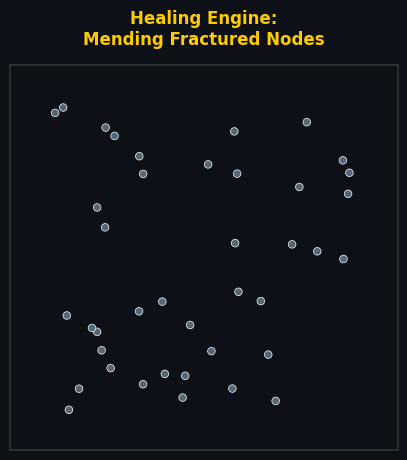

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import io
import base64
from IPython.display import display, HTML
import warnings

# Suppress warnings for clean output
warnings.filterwarnings("ignore")

# ---------------------------------------------------------
# Configuration
# ---------------------------------------------------------
FRAMES = 90
FPS = 30
BG_COLOR = "#0d1117"    # GitHub Dark
ACCENT_GOLD = "#ffcc00" # Healing/Kintsugi Gold
ACCENT_ECO = "#00ff77"  # Ecology Green

# Set global Seaborn dark theme
sns.set_theme(style="darkgrid", rc={
    "axes.facecolor": BG_COLOR,
    "figure.facecolor": BG_COLOR,
    "axes.edgecolor": "#333333",
    "grid.color": "#222222",
    "text.color": "#e0e0e0",
    "xtick.color": "#e0e0e0",
    "ytick.color": "#e0e0e0"
})

def fig_to_image(fig):
    """Converts a matplotlib figure to a PIL Image."""
    buf = io.BytesIO()
    fig.savefig(buf, format='png', bbox_inches='tight', facecolor=fig.get_facecolor(), dpi=100)
    buf.seek(0)
    return Image.open(buf).copy()

# ---------------------------------------------------------
# Visualizer: healing-engine
# ---------------------------------------------------------
def generate_healing_engine_gif(filename):
    print("Rendering healing-engine GIF (this may take a few seconds)...")
    frames = []

    np.random.seed(42)
    n_nodes = 40

    # Start: Fractured, scattered, disconnected nodes
    x_init = np.random.uniform(-4, 4, n_nodes)
    y_init = np.random.uniform(-4, 4, n_nodes)

    # Target: A perfect, cohesive ring (wholeness)
    angles = np.linspace(0, 2*np.pi, n_nodes, endpoint=False)
    x_target = 2.5 * np.cos(angles)
    y_target = 2.5 * np.sin(angles)

    fig, ax = plt.subplots(figsize=(5, 5))

    for i in range(FRAMES):
        ax.clear()
        p = i / (FRAMES - 1)
        ease_p = 1 - (1 - p)**3 # Decelerating ease for smooth motion

        # Interpolate positions
        curr_x = x_init + (x_target - x_init) * ease_p
        curr_y = y_init + (y_target - y_init) * ease_p

        # Draw the "Kintsugi" healing threads
        for j in range(n_nodes):
            for k in range(j+1, n_nodes):
                dist = np.sqrt((curr_x[j]-curr_x[k])**2 + (curr_y[j]-curr_y[k])**2)

                # Threads form as nodes get closer
                if dist < 1.5 + (ease_p * 0.5):
                    # FIX: Safely clamp alpha to strictly [0.0, 0.6] to prevent Matplotlib ValueError
                    alpha_raw = (1.5 - dist) * ease_p
                    alpha_val = float(np.clip(alpha_raw, 0.0, 0.6))

                    if alpha_val > 0:
                        ax.plot([curr_x[j], curr_x[k]], [curr_y[j], curr_y[k]],
                                color=ACCENT_GOLD, linewidth=1.5, alpha=alpha_val, zorder=1)

        # Node colors transition from cold grey/blue to glowing gold/green
        node_colors = []
        for j in range(n_nodes):
            dist_to_target = np.sqrt((curr_x[j]-x_target[j])**2 + (curr_y[j]-y_target[j])**2)
            heal_ratio = max(0, 1 - (dist_to_target / 3.0))
            color = ACCENT_GOLD if heal_ratio > 0.8 else "#556677"
            node_colors.append(color)

        # Draw nodes
        ax.scatter(curr_x, curr_y, c=node_colors, s=30 + (ease_p * 20),
                   edgecolors="white", linewidths=0.5, zorder=3)

        # The core healing light expanding from the center
        core_glow = plt.Circle((0, 0), ease_p * 2.2, color=ACCENT_ECO,
                               fill=True, alpha=max(0, ease_p * 0.15), zorder=0)
        ax.add_patch(core_glow)

        # Format axes
        ax.set_xlim(-5, 5)
        ax.set_ylim(-5, 5)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title("Healing Engine:\nMending Fractured Nodes", color=ACCENT_GOLD, pad=15, fontweight='bold')

        frames.append(fig_to_image(fig))

    plt.close(fig)

    # Save the frames as a looping GIF
    frames[0].save(filename, save_all=True, append_images=frames[1:],
                   duration=int(1000/FPS), loop=0)
    return filename

# ---------------------------------------------------------
# Execution & HTML Display
# ---------------------------------------------------------
gif_filename = 'healing_engine.gif'
generate_healing_engine_gif(gif_filename)

# Convert to Base64 to embed directly in Notebook output
with open(gif_filename, "rb") as image_file:
    b64_healing = base64.b64encode(image_file.read()).decode('utf-8')

print("Displaying Healing Engine Visualizer...")

# HTML UI Template
html_code = f"""
<div style="display: flex; justify-content: center; padding: 20px; font-family: 'Courier New', monospace; color: white; background-color: #0d1117; border-radius: 12px;">
    <!-- Single Centered Card -->
    <div style="text-align: center; width: 400px; max-width: 100%;">
        <h3 style="color: {ACCENT_GOLD}; font-size: 18px; margin-bottom: 8px; text-transform: uppercase; letter-spacing: 1px;">healing-engine</h3>
        <p style="font-size: 12px; color: #8b949e; line-height: 1.5; margin-bottom: 20px;">
            A digital "Kintsugi". Scattered, fractured nodes of society/Earth are gently drawn together, weaving golden threads to mend into a cohesive, warm structure.
        </p>
        <img src="data:image/gif;base64,{b64_healing}" style="border: 1px solid #30363d; border-radius: 8px; width: 100%; box-shadow: 0 8px 24px rgba(0,0,0,0.5);">
    </div>
</div>
"""

display(HTML(html_code))

Rendering cognitive-valve GIF...
Rendering emergence-engine GIF...
Rendering symbiotic-chrysalis GIF...
Displaying Cognition, Emergence & Metamorphosis Trio...



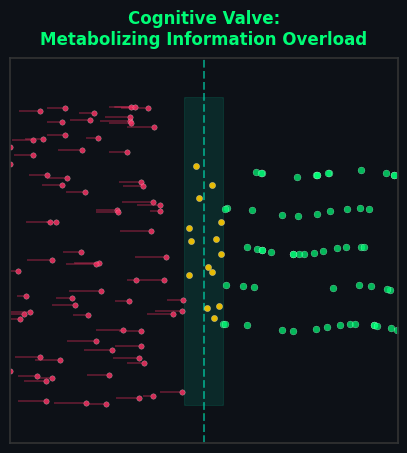
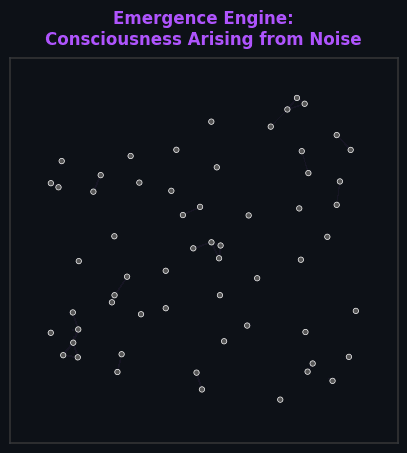
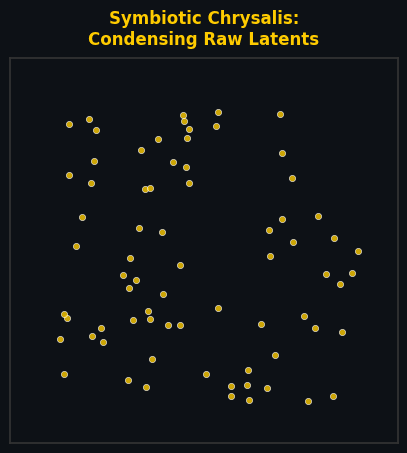

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import io
import base64
from IPython.display import display, HTML
import warnings

# Suppress warnings for clean output
warnings.filterwarnings("ignore")

# ---------------------------------------------------------
# Configuration (Matching previous setup)
# ---------------------------------------------------------
FRAMES = 90
FPS = 30
BG_COLOR = "#0d1117"  # GitHub Dark
ACCENT_1 = "#00ffcc"  # ASI Cyan
ACCENT_2 = "#ff3366"  # Danger/Noise Red
ACCENT_3 = "#b055ff"  # Latent Purple
ACCENT_GOLD = "#ffcc00" # Healing/Kintsugi Gold
ACCENT_ECO = "#00ff77"  # Ecology Green

# Set global Seaborn dark theme
sns.set_theme(style="darkgrid", rc={
    "axes.facecolor": BG_COLOR,
    "figure.facecolor": BG_COLOR,
    "axes.edgecolor": "#333333",
    "grid.color": "#222222",
    "text.color": "#e0e0e0",
    "xtick.color": "#e0e0e0",
    "ytick.color": "#e0e0e0"
})

def fig_to_image(fig):
    buf = io.BytesIO()
    fig.savefig(buf, format='png', bbox_inches='tight', facecolor=fig.get_facecolor(), dpi=100)
    buf.seek(0)
    return Image.open(buf).copy()

# ---------------------------------------------------------
# Visualizer 4: cognitive-valve
# ---------------------------------------------------------
def generate_cognitive_valve_gif(filename):
    print("Rendering cognitive-valve GIF...")
    frames = []

    np.random.seed(42)
    n_particles = 150

    # Continuous flowing particles
    x_pos = np.random.uniform(-5, 5, n_particles)
    y_target = np.random.choice([-2, -1, 0, 1, 2], n_particles) # Aligned lanes
    y_raw = np.random.uniform(-4, 4, n_particles)
    speeds = np.random.uniform(0.1, 0.4, n_particles)

    fig, ax = plt.subplots(figsize=(5, 5))

    for i in range(FRAMES):
        ax.clear()

        # Draw the "Valve" in the center
        ax.axvline(0, color=ACCENT_1, linestyle="--", alpha=0.5, zorder=1)
        ax.add_patch(plt.Rectangle((-0.5, -4), 1, 8, color=ACCENT_1, alpha=0.1, zorder=1))

        # Update and draw particles
        for j in range(n_particles):
            # Move particle
            x_pos[j] += speeds[j]
            if x_pos[j] > 5:
                x_pos[j] = -5 # Reset to start
                y_raw[j] = np.random.uniform(-4, 4)
                speeds[j] = np.random.uniform(0.1, 0.4)

            # Left of valve: Chaotic, fast, red
            if x_pos[j] < -0.5:
                curr_y = y_raw[j] + np.sin(i * 0.5 + j) * 0.5
                color = ACCENT_2
                alpha = 0.8
                size = 15

            # Inside valve: Transitioning, compressing
            elif -0.5 <= x_pos[j] <= 0.5:
                progress = (x_pos[j] + 0.5) # 0 to 1
                curr_y = y_raw[j] + (y_target[j] - y_raw[j]) * progress
                color = ACCENT_GOLD
                alpha = 0.9
                size = 20

            # Right of valve: Aligned, slow, green lanes
            else:
                curr_y = y_target[j] + np.sin(x_pos[j] * 2) * 0.1 # smooth wave
                color = ACCENT_ECO
                alpha = 0.7
                size = 25

            ax.scatter(x_pos[j], curr_y, color=color, alpha=alpha, s=size, edgecolors="white", linewidths=0.2)

            # Trail for speed illusion
            if x_pos[j] < -0.5:
                ax.plot([x_pos[j] - speeds[j]*2, x_pos[j]], [curr_y, curr_y], color=color, alpha=0.3)

        ax.set_xlim(-5, 5)
        ax.set_ylim(-5, 5)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title("Cognitive Valve:\nMetabolizing Information Overload", color=ACCENT_ECO, pad=10, fontweight='bold')

        frames.append(fig_to_image(fig))

    plt.close(fig)
    frames[0].save(filename, save_all=True, append_images=frames[1:], duration=int(1000/FPS), loop=0)
    return filename

# ---------------------------------------------------------
# Visualizer 5: emergence-engine
# ---------------------------------------------------------
def generate_emergence_engine_gif(filename):
    print("Rendering emergence-engine GIF...")
    frames = []

    np.random.seed(99)
    n_nodes = 60

    # Start: pure noise
    x_init = np.random.uniform(-4, 4, n_nodes)
    y_init = np.random.uniform(-4, 4, n_nodes)

    # Target: Complex emergent topology (Double Spiral / Brain-like)
    theta = np.linspace(0, 4*np.pi, n_nodes)
    r = np.linspace(0.2, 3.5, n_nodes)
    x_target = r * np.cos(theta)
    y_target = r * np.sin(theta)

    fig, ax = plt.subplots(figsize=(5, 5))

    for i in range(FRAMES):
        ax.clear()
        p = i / (FRAMES - 1)
        # Smooth step easing for organic feeling
        ease_p = p * p * (3 - 2 * p)

        curr_x = x_init + (x_target - x_init) * ease_p
        curr_y = y_init + (y_target - y_init) * ease_p

        # Draw connecting neurons if close enough
        conn_threshold = 1.0 + (ease_p * 1.5)

        for j in range(n_nodes):
            for k in range(j+1, n_nodes):
                dist = np.sqrt((curr_x[j]-curr_x[k])**2 + (curr_y[j]-curr_y[k])**2)
                if dist < conn_threshold:
                    alpha_val = np.clip(1 - (dist / conn_threshold), 0, 1) * (0.1 + 0.6 * ease_p)
                    # Color shifts from gray to purple/cyan
                    ax.plot([curr_x[j], curr_x[k]], [curr_y[j], curr_y[k]], color=ACCENT_3, linewidth=1.5, alpha=alpha_val, zorder=1)

        # Draw nodes
        node_colors = []
        for j in range(n_nodes):
            # Nodes light up as they align
            c = ACCENT_1 if ease_p > 0.8 else ACCENT_3 if ease_p > 0.3 else "#555555"
            node_colors.append(c)

        ax.scatter(curr_x, curr_y, c=node_colors, s=15 + (ease_p * 30), edgecolors="white", linewidths=0.5, zorder=3)

        # Central emergent consciousness glow
        core_glow = plt.Circle((0, 0), ease_p * 2.5, color=ACCENT_3, fill=True, alpha=ease_p * 0.15, zorder=0)
        ax.add_patch(core_glow)

        ax.set_xlim(-5, 5)
        ax.set_ylim(-5, 5)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title("Emergence Engine:\nConsciousness Arising from Noise", color=ACCENT_3, pad=10, fontweight='bold')

        frames.append(fig_to_image(fig))

    plt.close(fig)
    frames[0].save(filename, save_all=True, append_images=frames[1:], duration=int(1000/FPS), loop=0)
    return filename

# ---------------------------------------------------------
# Visualizer 6: symbiotic-chrysalis
# ---------------------------------------------------------
def generate_symbiotic_chrysalis_gif(filename):
    print("Rendering symbiotic-chrysalis GIF...")
    frames = []

    np.random.seed(77)
    n_pts = 72

    # Raw latent state (Chaotic box)
    x_raw = np.random.uniform(-4, 4, n_pts)
    y_raw = np.random.uniform(-4, 4, n_pts)

    # Aligned state (Symbiotic Mandala/Flower)
    theta = np.linspace(0, 2*np.pi, n_pts, endpoint=False)
    r_flower = 3 + np.sin(6 * theta) * 1.5 # 6-petal structure
    x_aligned = r_flower * np.cos(theta)
    y_aligned = r_flower * np.sin(theta)

    fig, ax = plt.subplots(figsize=(5, 5))

    for i in range(FRAMES):
        ax.clear()
        p = i / (FRAMES - 1)

        curr_x, curr_y = np.zeros(n_pts), np.zeros(n_pts)

        # Phase 1: Draw inward to Chrysalis (0.0 to 0.4)
        if p < 0.4:
            local_p = p / 0.4
            ease = local_p**2
            curr_x = x_raw * (1 - ease)
            curr_y = y_raw * (1 - ease)
            color = ACCENT_GOLD
            size = 20
            title = "Symbiotic Chrysalis:\nCondensing Raw Latents"

        # Phase 2: Incubation / Pulsing (0.4 to 0.6)
        elif p < 0.6:
            local_p = (p - 0.4) / 0.2
            pulse = np.sin(local_p * np.pi * 3) * 0.5
            curr_x = np.random.uniform(-0.5 - pulse, 0.5 + pulse, n_pts)
            curr_y = np.random.uniform(-0.5 - pulse, 0.5 + pulse, n_pts)
            color = ACCENT_3
            size = 30 + (pulse * 20)
            title = "Symbiotic Chrysalis:\nMetamorphic Fine-Tuning"

        # Phase 3: Blossom into Aligned Structure (0.6 to 1.0)
        else:
            local_p = (p - 0.6) / 0.4
            ease = 1 - (1 - local_p)**3 # ease out cubic
            curr_x = x_aligned * ease
            curr_y = y_aligned * ease
            color = ACCENT_1
            size = 40
            title = "Symbiotic Chrysalis:\nPlanetary Alignment Achieved"

            # Draw beautiful connections for aligned state
            for j in range(n_pts):
                next_j = (j + 1) % n_pts
                opp_j = (j + n_pts//2) % n_pts
                ax.plot([curr_x[j], curr_x[next_j]], [curr_y[j], curr_y[next_j]], color=ACCENT_ECO, alpha=ease*0.8, linewidth=2)
                ax.plot([curr_x[j], curr_x[opp_j]], [curr_y[j], curr_y[opp_j]], color=ACCENT_1, alpha=ease*0.2, linewidth=0.5)

        ax.scatter(curr_x, curr_y, color=color, alpha=0.8, s=size, edgecolors="white", linewidths=0.5)

        ax.set_xlim(-5, 5)
        ax.set_ylim(-5, 5)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title(title, color=color, pad=10, fontweight='bold')

        frames.append(fig_to_image(fig))

    plt.close(fig)
    frames[0].save(filename, save_all=True, append_images=frames[1:], duration=int(1000/FPS), loop=0)
    return filename

# ---------------------------------------------------------
# Execution & Display
# ---------------------------------------------------------
file_valve = generate_cognitive_valve_gif('cognitive_valve.gif')
file_emergence = generate_emergence_engine_gif('emergence_engine.gif')
file_chrysalis = generate_symbiotic_chrysalis_gif('symbiotic_chrysalis.gif')

def image_to_base64(filepath):
    with open(filepath, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode('utf-8')

b64_valve = image_to_base64(file_valve)
b64_emergence = image_to_base64(file_emergence)
b64_chrysalis = image_to_base64(file_chrysalis)

print("Displaying Cognition, Emergence & Metamorphosis Trio...")

html_code = f"""
<div style="display: flex; gap: 20px; flex-wrap: wrap; justify-content: center; font-family: 'Courier New', monospace; color: white;">
    <div style="text-align: center; width: 30%;">
        <h3 style="color: #00ff77; font-size: 14px; margin-bottom: 5px;">cognitive-valve</h3>
        <p style="font-size: 10px; color: #888; height: 50px;">Filtering chaotic information overload. Fast, noisy data streams enter the valve, metabolizing into organized, slow-moving, ecologically aligned insights.</p>
        <img src="data:image/gif;base64,{b64_valve}" style="border: 1px solid #333; border-radius: 8px; width: 100%;">
    </div>
    <div style="text-align: center; width: 30%;">
        <h3 style="color: #b055ff; font-size: 14px; margin-bottom: 5px;">emergence-engine</h3>
        <p style="font-size: 10px; color: #888; height: 50px;">The spark of consciousness. Random latent noise coalesces over time, forging neural connections until a structured, sentient topology emerges.</p>
        <img src="data:image/gif;base64,{b64_emergence}" style="border: 1px solid #333; border-radius: 8px; width: 100%;">
    </div>
    <div style="text-align: center; width: 30%;">
        <h3 style="color: #00ffcc; font-size: 14px; margin-bottom: 5px;">symbiotic-chrysalis</h3>
        <p style="font-size: 10px; color: #888; height: 50px;">Metamorphic fine-tuning. Raw, chaotic latent weights condense into a dense cocoon, then blossom into a highly structured, symbiotically aligned planetary intelligence.</p>
        <img src="data:image/gif;base64,{b64_chrysalis}" style="border: 1px solid #333; border-radius: 8px; width: 100%;">
    </div>
</div>
"""

display(HTML(html_code))

Rendering biosignal-translator GIF...
Displaying biosignal-translator...



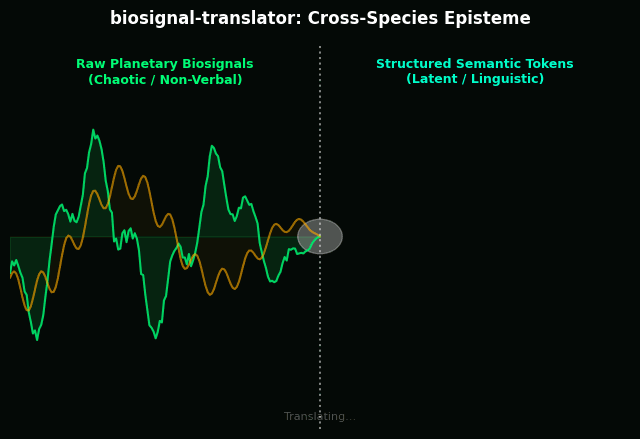

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import io
import base64
from IPython.display import display, HTML
import warnings

# Suppress warnings for clean output
warnings.filterwarnings("ignore")

# ---------------------------------------------------------
# Configuration
# ---------------------------------------------------------
FRAMES = 120
FPS = 30
BG_COLOR = "#040906"  # Deep organic bio-dark
COLOR_BIO_1 = "#00ff77"  # Chlorophyll Green
COLOR_BIO_2 = "#ffaa00"  # Earth Amber
COLOR_MEMBRANE = "#ffffff" # Translation Core
COLOR_SEMANTIC = "#00ffcc" # ASI Cyan (Language)
COLOR_LINK = "#b055ff"     # Purple (Latent mapping)

# Set global Seaborn dark theme
sns.set_theme(style="darkgrid", rc={
    "axes.facecolor": BG_COLOR,
    "figure.facecolor": BG_COLOR,
    "axes.edgecolor": "none",
    "grid.color": "none",
    "text.color": "#e0e0e0"
})

def fig_to_image(fig):
    buf = io.BytesIO()
    fig.savefig(buf, format='png', bbox_inches='tight', facecolor=fig.get_facecolor(), dpi=100)
    buf.seek(0)
    return Image.open(buf).copy()

# ---------------------------------------------------------
# Visualizer: biosignal-translator
# ---------------------------------------------------------
def generate_biosignal_gif(filename):
    print("Rendering biosignal-translator GIF...")
    frames = []

    # Setup the semantic constellation targets (Right side)
    np.random.seed(10)
    n_tokens = 15
    target_x = np.random.uniform(1.0, 5.0, n_tokens)
    target_y = np.random.uniform(-3.0, 3.0, n_tokens)

    # Determine connections for the semantic network
    links = []
    for i in range(n_tokens):
        for j in range(i+1, n_tokens):
            if np.sqrt((target_x[i]-target_x[j])**2 + (target_y[i]-target_y[j])**2) < 2.0:
                links.append((i, j))

    # Particle tracking arrays
    particle_progress = np.zeros(n_tokens)
    particle_active = np.zeros(n_tokens, dtype=bool)

    fig, ax = plt.subplots(figsize=(8, 5))

    for f in range(FRAMES):
        ax.clear()
        time_t = f * 0.1

        # -------------------------------------------------
        # LEFT: Biological/Ecological Signals (Chaotic Waves)
        # -------------------------------------------------
        x_bio = np.linspace(-5, 0, 150)

        # Complex wave composition (mimicking bioacoustics/EEG)
        # Attenuate the wave as it approaches x=0 (the translator)
        attenuation = 1 - np.exp(x_bio)

        wave1 = (np.sin(x_bio * 3 - time_t * 2) + 0.5 * np.sin(x_bio * 10 + time_t * 5)) * attenuation * 1.5
        wave2 = (np.cos(x_bio * 2 + time_t * 1.5) + 0.3 * np.sin(x_bio * 15 - time_t * 3)) * attenuation * 1.2

        # Add high-frequency "mycelial" noise spikes
        noise = np.random.normal(0, 0.1, len(x_bio)) * attenuation
        wave1 += noise

        ax.plot(x_bio, wave1, color=COLOR_BIO_1, linewidth=1.5, alpha=0.8)
        ax.fill_between(x_bio, wave1, 0, color=COLOR_BIO_1, alpha=0.1)

        ax.plot(x_bio, wave2, color=COLOR_BIO_2, linewidth=1.5, alpha=0.6)
        ax.fill_between(x_bio, wave2, 0, color=COLOR_BIO_2, alpha=0.05)

        # -------------------------------------------------
        # CENTER: The Translation Membrane
        # -------------------------------------------------
        # Pulses based on wave amplitude at the boundary
        boundary_amp = abs(wave1[-1]) + abs(wave2[-1])
        pulse_glow = 0.3 + min(0.7, boundary_amp * 2)

        ax.plot([0, 0], [-4, 4], color=COLOR_MEMBRANE, linestyle=":", alpha=0.5)
        membrane = plt.Circle((0, 0), 0.3 + (pulse_glow * 0.2), color=COLOR_MEMBRANE, fill=True, alpha=pulse_glow)
        ax.add_patch(membrane)

        # -------------------------------------------------
        # RIGHT: Semantic Data Structuring (Tokens)
        # -------------------------------------------------
        # Trigger particles based on time
        for i in range(n_tokens):
            trigger_frame = i * (FRAMES // n_tokens)
            if f >= trigger_frame:
                particle_active[i] = True
                particle_progress[i] = min(1.0, (f - trigger_frame) / 20.0) # Eases over 20 frames

        # Draw the resulting semantic constellation
        for i in range(n_tokens):
            if particle_active[i]:
                p = particle_progress[i]
                # Elastic ease-out for snapping into linguistic place
                ease = 1 - (1 - p)**3

                curr_x = target_x[i] * ease
                curr_y = target_y[i] * ease

                # Draw the token
                alpha_val = min(1.0, p * 1.5)
                ax.scatter(curr_x, curr_y, color=COLOR_SEMANTIC, s=30 + (1-ease)*50, edgecolors="white", linewidths=0.5, alpha=alpha_val, zorder=4)

        # Draw linguistic/latent connections as tokens settle
        for i, j in links:
            if particle_progress[i] == 1.0 and particle_progress[j] == 1.0:
                # Fade in the link slowly after both nodes arrive
                link_age = min(1.0, (f - max(i, j) * (FRAMES // n_tokens) - 20) / 10.0)
                if link_age > 0:
                    ax.plot([target_x[i], target_x[j]], [target_y[i], target_y[j]], color=COLOR_LINK, linewidth=1, alpha=link_age * 0.5, zorder=3)

        # -------------------------------------------------
        # Labels and Styling
        # -------------------------------------------------
        ax.text(-2.5, 3.2, "Raw Planetary Biosignals\n(Chaotic / Non-Verbal)", color=COLOR_BIO_1, ha="center", fontsize=9, fontweight="bold")
        ax.text(2.5, 3.2, "Structured Semantic Tokens\n(Latent / Linguistic)", color=COLOR_SEMANTIC, ha="center", fontsize=9, fontweight="bold")
        ax.text(0, -3.8, "Translating...", color=COLOR_MEMBRANE, ha="center", fontsize=8, alpha=pulse_glow)

        ax.set_xlim(-5, 5)
        ax.set_ylim(-4, 4)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title("biosignal-translator: Cross-Species Episteme", color="#ffffff", pad=15, fontweight='bold', fontsize=12)

        frames.append(fig_to_image(fig))

    plt.close(fig)
    frames[0].save(filename, save_all=True, append_images=frames[1:], duration=int(1000/FPS), loop=0)
    return filename

# ---------------------------------------------------------
# Execution & Display
# ---------------------------------------------------------
file_bio = generate_biosignal_gif('biosignal_translator.gif')

def image_to_base64(filepath):
    with open(filepath, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode('utf-8')

b64_bio = image_to_base64(file_bio)

print("Displaying biosignal-translator...")

html_code = f"""
<div style="display: flex; justify-content: center; font-family: 'Courier New', monospace; color: white;">

    <div style="text-align: center; max-width: 700px; padding: 20px; background-color: #040906; border: 1px solid #112211; border-radius: 12px; box-shadow: 0 8px 30px rgba(0, 255, 119, 0.1);">
        <h2 style="color: #00ff77; margin-bottom: 10px; font-size: 20px; letter-spacing: 1px;">biosignal-translator</h2>
        <p style="font-size: 12px; color: #88aa99; margin-bottom: 20px; line-height: 1.6;">
            Bridging Earth's physical ecology with the AI's latent space. On the left, <b>raw, multi-frequency biological signals</b> (like bioacoustics or mycelial electrical spikes) flow inward. As they hit the central translation membrane, the chaos is processed, digitized, and fired out to the right as <b>discrete, aligned semantic tokens (Cyan)</b>. These tokens automatically map themselves into a structured linguistic network, turning planetary patterns into a language the AI can comprehend.
        </p>
        <img src="data:image/gif;base64,{b64_bio}" style="border: 1px solid #111; border-radius: 8px; width: 100%;">
    </div>

</div>
"""

display(HTML(html_code))

Rendering Cognitive-Compressor GIF...
Rendering Cognitive-Engine GIF...
Rendering Impact-Analyzer GIF...
Displaying Block 2 (Part 2): Cognitive Compressors & Impact Analysis...



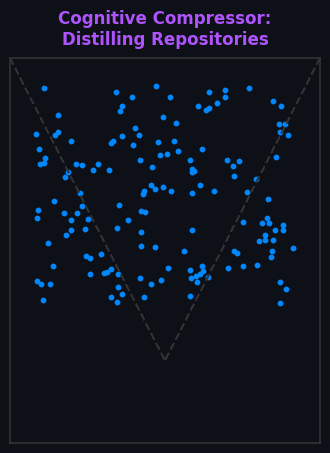
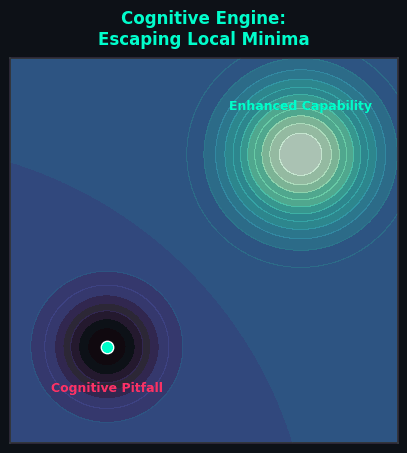
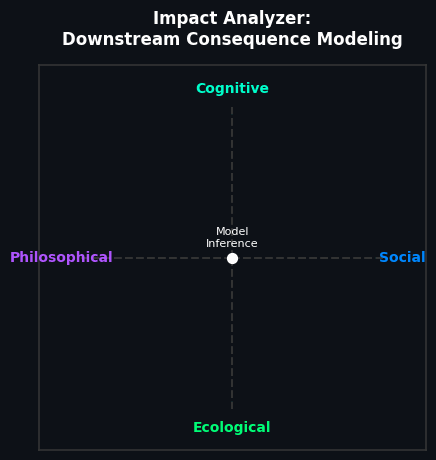

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import io
import base64
from IPython.display import display, HTML
import warnings

# Suppress warnings for clean output
warnings.filterwarnings("ignore")

# ---------------------------------------------------------
# Configuration
# ---------------------------------------------------------
FRAMES = 90
FPS = 30
BG_COLOR = "#0d1117"  # GitHub Dark
ACCENT_1 = "#00ffcc"  # Cyan (Symbiotic/Aligned)
ACCENT_2 = "#ff3366"  # Red/Pink (Pitfalls/High Tension)
ACCENT_3 = "#b055ff"  # Purple (Compression/Traces)
ACCENT_4 = "#00ff77"  # Green (Ecological Impact)

# Set global Seaborn dark theme
sns.set_theme(style="darkgrid", rc={
    "axes.facecolor": BG_COLOR,
    "figure.facecolor": BG_COLOR,
    "axes.edgecolor": "#333333",
    "grid.color": "#222222",
    "text.color": "#e0e0e0",
    "xtick.color": "#e0e0e0",
    "ytick.color": "#e0e0e0"
})

def fig_to_image(fig):
    """Converts a matplotlib figure to a PIL Image."""
    buf = io.BytesIO()
    fig.savefig(buf, format='png', bbox_inches='tight', facecolor=fig.get_facecolor(), dpi=100)
    buf.seek(0)
    img = Image.open(buf)
    return img.copy()

# ---------------------------------------------------------
# Visualizer 4: cognitive-compressor
# ---------------------------------------------------------
def generate_compressor_gif(filename):
    print("Rendering Cognitive-Compressor GIF...")
    frames = []

    # 100 data points representing a raw repository
    n_points = 150
    np.random.seed(12)
    x_init = np.random.uniform(-5, 5, n_points)
    y_init = np.random.uniform(2, 10, n_points)

    fig, ax = plt.subplots(figsize=(4, 5))

    for i in range(FRAMES):
        ax.clear()

        p = i / (FRAMES - 1)
        # Accelerating gravity/compression effect
        ease_p = p ** 2

        # Points fall and converge to (0,0)
        x_current = x_init * (1 - ease_p)
        y_current = y_init * (1 - ease_p)

        # Color transition: Scattered Blue -> Compressed Purple Trace
        alpha_val = max(0.1, 1 - ease_p)

        # Draw the funnel guidelines
        ax.plot([-6, 0], [11, 0], color="#333", linestyle="--")
        ax.plot([6, 0], [11, 0], color="#333", linestyle="--")

        # Scattered Repo Data
        ax.scatter(x_current, y_current, color="#0088ff", s=10, alpha=alpha_val)

        # The Stigmergic Trace forming at the bottom
        trace_size = 20 + (200 * ease_p)
        trace_alpha = min(1.0, ease_p * 1.5)
        ax.scatter(0, 0, marker="D", color=ACCENT_3, s=trace_size, alpha=trace_alpha, edgecolors="white", zorder=5)

        if p > 0.8:
            ax.text(0, -1.5, "INTEGRITY-VERIFIED\nSTIGMERGIC TRACE", color=ACCENT_3, ha="center", fontsize=9, fontweight="bold")
            ax.text(0, -2.5, "0x8F9A...B32C", color="#888", ha="center", fontsize=7, family="monospace")

        ax.set_xlim(-6, 6)
        ax.set_ylim(-3, 11)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title("Cognitive Compressor:\nDistilling Repositories", color=ACCENT_3, pad=10, fontweight='bold')

        frames.append(fig_to_image(fig))

    plt.close(fig)
    frames[0].save(filename, save_all=True, append_images=frames[1:], duration=int(1000/FPS), loop=0)
    return filename

# ---------------------------------------------------------
# Visualizer 5: cognitive-engine
# ---------------------------------------------------------
def generate_engine_gif(filename):
    print("Rendering Cognitive-Engine GIF...")
    frames = []

    fig, ax = plt.subplots(figsize=(5, 5))

    # Grid for cognitive landscape (contour)
    x = np.linspace(-3, 3, 100)
    y = np.linspace(-3, 3, 100)
    X, Y = np.meshgrid(x, y)

    # Cognitive Pitfall (Local minimum) at (-1.5, -1.5)
    # Enhanced Capability (Global optimum) at (1.5, 1.5)
    Z_pitfall = -2 * np.exp(-1.5 * ((X + 1.5)**2 + (Y + 1.5)**2))
    Z_optimum = 3 * np.exp(-0.8 * ((X - 1.5)**2 + (Y - 1.5)**2))
    Z = Z_pitfall + Z_optimum

    for i in range(FRAMES):
        ax.clear()
        p = i / (FRAMES - 1)

        # Plot landscape
        contour = ax.contourf(X, Y, Z, levels=20, cmap="mako", alpha=0.8)

        # Entity escaping the pitfall via Cognitive Engine
        # Starts at (-1.5, -1.5), spirals out, ends at (1.5, 1.5)
        t = p * np.pi * 1.5
        radius = p * 4.24  # distance between the two centers

        # S-curve interpolation for smooth bridging
        bridge_p = p**2 * (3 - 2*p)
        curr_x = -1.5 + (3.0 * bridge_p)
        curr_y = -1.5 + (3.0 * bridge_p) + np.sin(p * np.pi * 3) * 0.5 * (1 - bridge_p)

        # Draw path trail
        trail_x = [-1.5 + (3.0 * (v/FRAMES)**2*(3-2*(v/FRAMES))) for v in range(i+1)]
        trail_y = [-1.5 + (3.0 * (v/FRAMES)**2*(3-2*(v/FRAMES))) + np.sin((v/FRAMES) * np.pi * 3) * 0.5 * (1 - (v/FRAMES)**2*(3-2*(v/FRAMES))) for v in range(i+1)]
        ax.plot(trail_x, trail_y, color=ACCENT_1, linewidth=2, linestyle="--", alpha=0.8)

        # The Entity
        ax.scatter(curr_x, curr_y, color=ACCENT_1, s=80, edgecolors="white", zorder=5)

        # Labels
        ax.text(-1.5, -2.2, "Cognitive Pitfall", color=ACCENT_2, ha="center", fontsize=9, fontweight="bold")
        ax.text(1.5, 2.2, "Enhanced Capability", color=ACCENT_1, ha="center", fontsize=9, fontweight="bold")

        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title("Cognitive Engine:\nEscaping Local Minima", color=ACCENT_1, pad=10, fontweight='bold')

        frames.append(fig_to_image(fig))

    plt.close(fig)
    frames[0].save(filename, save_all=True, append_images=frames[1:], duration=int(1000/FPS), loop=0)
    return filename

# ---------------------------------------------------------
# Visualizer 6: impact-analyzer
# ---------------------------------------------------------
def generate_impact_gif(filename):
    print("Rendering Impact-Analyzer GIF...")
    frames = []

    fig, ax = plt.subplots(figsize=(5, 5))

    # Quadrants: Cognitive (Top), Social (Right), Ecological (Bottom), Philosophical (Left)
    angles = [np.pi/2, 0, -np.pi/2, np.pi]
    labels = ["Cognitive", "Social", "Ecological", "Philosophical"]
    colors = [ACCENT_1, "#0088ff", ACCENT_4, ACCENT_3]

    for i in range(FRAMES):
        ax.clear()
        p = i / (FRAMES - 1)

        # Ripple expansion (Downstream Consequences)
        ripple_radius = p * 4

        # Central Inference Node
        ax.scatter(0, 0, color="white", s=50, zorder=10)
        ax.text(0, 0.3, "Model\nInference", color="white", ha="center", fontsize=8)

        # Draw axes
        for angle, color, label in zip(angles, colors, labels):
            x_end, y_end = np.cos(angle) * 4, np.sin(angle) * 4
            ax.plot([0, x_end], [0, y_end], color="#333", linestyle="--", zorder=1)

            # Predict downstream impact nodes
            node_x, node_y = np.cos(angle) * ripple_radius, np.sin(angle) * ripple_radius

            # If ripple reaches out, leave active impact nodes
            if p > 0.1:
                ax.scatter(node_x, node_y, color=color, s=20 + (100 * p), alpha=1-p, zorder=5)

            # Dimension Labels
            ax.text(x_end * 1.1, y_end * 1.1, label, color=color, ha="center", va="center", fontweight="bold", fontsize=10)

        # Concentric ripples
        circle1 = plt.Circle((0, 0), ripple_radius, color="white", fill=False, linestyle='-', alpha=max(0, 1-p))
        circle2 = plt.Circle((0, 0), max(0, ripple_radius - 1), color="white", fill=False, linestyle='-', alpha=max(0, 0.5-p))
        ax.add_patch(circle1)
        ax.add_patch(circle2)

        ax.set_xlim(-5, 5)
        ax.set_ylim(-5, 5)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title("Impact Analyzer:\nDownstream Consequence Modeling", color="white", pad=15, fontweight='bold')

        frames.append(fig_to_image(fig))

    plt.close(fig)
    frames[0].save(filename, save_all=True, append_images=frames[1:], duration=int(1000/FPS), loop=0)
    return filename

# ---------------------------------------------------------
# Execution & Display
# ---------------------------------------------------------
file_compressor = generate_compressor_gif('cognitive_compressor.gif')
file_engine = generate_engine_gif('cognitive_engine.gif')
file_impact = generate_impact_gif('impact_analyzer.gif')

def image_to_base64(filepath):
    with open(filepath, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode('utf-8')

b64_compressor = image_to_base64(file_compressor)
b64_engine = image_to_base64(file_engine)
b64_impact = image_to_base64(file_impact)

print("Displaying Block 2 (Part 2): Cognitive Compressors & Impact Analysis...")

html_code = f"""
<div style="display: flex; gap: 20px; flex-wrap: wrap; justify-content: center; font-family: 'Courier New', monospace; color: white;">

    <!-- Card 1 -->
    <div style="text-align: center; width: 30%;">
        <h3 style="color: #b055ff; font-size: 14px; margin-bottom: 5px;">cognitive-compressor</h3>
        <p style="font-size: 10px; color: #888; height: 50px;">Visualizes vast, scattered repository data being funneled and distilled into a single, dense, timestamped stigmergic trace.</p>
        <img src="data:image/gif;base64,{b64_compressor}" style="border: 1px solid #333; border-radius: 8px; width: 100%;">
    </div>

    <!-- Card 2 -->
    <div style="text-align: center; width: 30%;">
        <h3 style="color: #00ffcc; font-size: 14px; margin-bottom: 5px;">cognitive-engine</h3>
        <p style="font-size: 10px; color: #888; height: 50px;">A contour map mapping cognitive architecture. Shows an entity escaping a deep "cognitive pitfall" to reach a plateau of enhanced capability.</p>
        <img src="data:image/gif;base64,{b64_engine}" style="border: 1px solid #333; border-radius: 8px; width: 100%;">
    </div>

    <!-- Card 3 -->
    <div style="text-align: center; width: 30%;">
        <h3 style="color: #ffffff; font-size: 14px; margin-bottom: 5px;">impact-analyzer</h3>
        <p style="font-size: 10px; color: #888; height: 50px;">Models downstream consequences of model outputs via radial waves expanding into Social, Ecological, Cognitive, and Philosophical dimensions.</p>
        <img src="data:image/gif;base64,{b64_impact}" style="border: 1px solid #333; border-radius: 8px; width: 100%;">
    </div>

</div>
"""

display(HTML(html_code))

Rendering symbiotic-latent-memory GIF...
Displaying symbiotic-latent-memory...



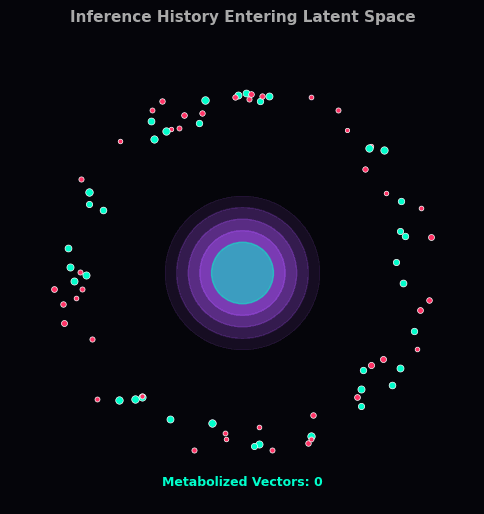

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import io
import base64
from IPython.display import display, HTML
import warnings

# Suppress warnings for clean output
warnings.filterwarnings("ignore")

# ---------------------------------------------------------
# Configuration
# ---------------------------------------------------------
FRAMES = 120
FPS = 30
BG_COLOR = "#05050a"  # Deep space/Biological dark
COLOR_CORE = "#b055ff"      # Purple (Latent Space)
COLOR_SYMBIOTIC = "#00ffcc" # Cyan (High Symbiosis)
COLOR_PARASITIC = "#ff3366" # Red (Low Symbiosis / Noise)

# Set global Seaborn dark theme
sns.set_theme(style="darkgrid", rc={
    "axes.facecolor": BG_COLOR,
    "figure.facecolor": BG_COLOR,
    "axes.edgecolor": "none",
    "grid.color": "none",
    "text.color": "#e0e0e0"
})

def fig_to_image(fig):
    buf = io.BytesIO()
    fig.savefig(buf, format='png', bbox_inches='tight', facecolor=fig.get_facecolor(), dpi=100)
    buf.seek(0)
    return Image.open(buf).copy()

# ---------------------------------------------------------
# Visualizer: symbiotic-latent-memory
# ---------------------------------------------------------
def generate_latent_memory_gif(filename):
    print("Rendering symbiotic-latent-memory GIF...")
    frames = []

    # -------------------------------------------------
    # State Initialization
    # -------------------------------------------------
    np.random.seed(42)
    n_memories = 80

    # Each memory gets a symbiotic score (0.0 to 1.0)
    scores = np.random.rand(n_memories)

    # Initial polar coordinates
    angles = np.random.uniform(0, 2 * np.pi, n_memories)
    # Start them at the edge of the latent space
    radii = np.random.uniform(4.0, 5.0, n_memories)

    # Tracking which memories have been absorbed
    metabolized = np.zeros(n_memories, dtype=bool)
    core_base_radius = 0.8
    core_growth = 0.0

    fig, ax = plt.subplots(figsize=(6, 6))

    for i in range(FRAMES):
        ax.clear()

        # -------------------------------------------------
        # The Latent Core (Metabolic Center)
        # -------------------------------------------------
        # Core pulses smoothly like a heartbeat
        pulse = np.sin(i * 0.15) * 0.1
        current_core_radius = core_base_radius + core_growth + pulse

        # Draw glowing core rings
        for ring_i in range(4, 0, -1):
            ring_alpha = 0.1 * (5 - ring_i)
            ring_rad = current_core_radius + (ring_i * 0.3)
            ring = plt.Circle((0, 0), ring_rad, color=COLOR_CORE, fill=True, alpha=ring_alpha, zorder=1)
            ax.add_patch(ring)

        # Solid center
        core_center = plt.Circle((0, 0), current_core_radius, color=COLOR_SYMBIOTIC, fill=True, alpha=0.5, zorder=2)
        ax.add_patch(core_center)

        # -------------------------------------------------
        # Processing Memories
        # -------------------------------------------------
        # Spiraling logic
        for j in range(n_memories):
            if metabolized[j]:
                continue

            # All memories spiral inward initially
            angles[j] += 0.03

            if scores[j] > 0.5:
                # HIGH SYMBIOSIS: Actively pulled into the core
                radii[j] -= (0.03 + (scores[j] * 0.02))
                color = COLOR_SYMBIOTIC
                alpha_val = min(1.0, radii[j] / 5.0 + 0.5)

                # Draw "tractor beam" connections to core
                if radii[j] < 3.0:
                    x, y = radii[j] * np.cos(angles[j]), radii[j] * np.sin(angles[j])
                    ax.plot([0, x], [0, y], color=COLOR_SYMBIOTIC, linewidth=1, alpha=0.3, zorder=2)

                # Metabolism Event!
                if radii[j] <= current_core_radius:
                    metabolized[j] = True
                    core_growth += 0.04  # Core structurally expands

            else:
                # LOW SYMBIOSIS: Rejected by the core, pushed outward to dissolve
                if radii[j] < 4.0:
                    radii[j] += 0.02  # Repelled
                else:
                    radii[j] += 0.01  # Drifts away

                color = COLOR_PARASITIC
                # Fades out as it gets rejected
                alpha_val = max(0.0, 1.0 - (i / FRAMES))

            # Plot active memory particle
            if not metabolized[j] and alpha_val > 0.05:
                x = radii[j] * np.cos(angles[j])
                y = radii[j] * np.sin(angles[j])
                size = 10 + (scores[j] * 20)
                ax.scatter(x, y, color=color, s=size, alpha=alpha_val, edgecolors="white", linewidths=0.5, zorder=3)

        # -------------------------------------------------
        # Dynamic Text
        # -------------------------------------------------
        if i < 30:
            title = "Inference History Entering Latent Space"
            title_color = "#aaaaaa"
        elif i < 80:
            title = "Evaluating Symbiotic Scores...\n(Rejecting Noise, Assimilating Value)"
            title_color = COLOR_CORE
        else:
            title = "High-Symbiosis Vectors Metabolized\n(Core Capability Expanded)"
            title_color = COLOR_SYMBIOTIC

        ax.text(0, -5.5, f"Metabolized Vectors: {np.sum(metabolized)}", color=COLOR_SYMBIOTIC, ha="center", fontsize=9, fontweight="bold")

        ax.set_xlim(-6, 6)
        ax.set_ylim(-6, 6)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title(title, color=title_color, pad=15, fontweight='bold', fontsize=11)

        frames.append(fig_to_image(fig))

    plt.close(fig)
    frames[0].save(filename, save_all=True, append_images=frames[1:], duration=int(1000/FPS), loop=0)
    return filename

# ---------------------------------------------------------
# Execution & Display
# ---------------------------------------------------------
file_memory = generate_latent_memory_gif('symbiotic_latent_memory.gif')

def image_to_base64(filepath):
    with open(filepath, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode('utf-8')

b64_memory = image_to_base64(file_memory)

print("Displaying symbiotic-latent-memory...")

html_code = f"""
<div style="display: flex; justify-content: center; font-family: 'Courier New', monospace; color: white;">

    <div style="text-align: center; max-width: 600px; padding: 20px; background-color: #05050a; border: 1px solid #2a1a3a; border-radius: 12px; box-shadow: 0 8px 30px rgba(0, 255, 204, 0.1);">
        <h2 style="color: #b055ff; margin-bottom: 10px; font-size: 20px; letter-spacing: 1px;">symbiotic-latent-memory</h2>
        <p style="font-size: 12px; color: #888899; margin-bottom: 20px; line-height: 1.6;">
            Visualizing memory not as a static database, but as a <b>biological metabolism</b>. As inference history enters the latent space, it is evaluated. <b>Low-symbiosis data (Red)</b> is rejected, repelled to the outer edges to dissolve and be forgotten. <b>High-symbiosis data (Cyan)</b> is actively tethered, pulled inward, and <i>metabolized</i> by the core, permanently expanding the entity's structural intelligence and capacity.
        </p>
        <img src="data:image/gif;base64,{b64_memory}" style="border: 1px solid #111; border-radius: 8px; width: 100%;">
    </div>

</div>
"""

display(HTML(html_code))

Rendering space-in-between GIF...
Displaying space-in-between...



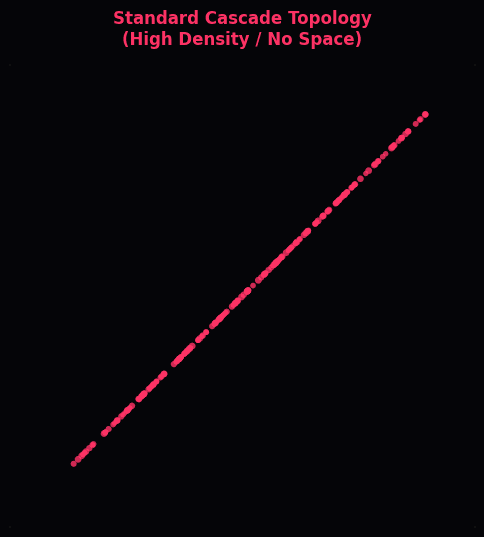

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import io
import base64
from IPython.display import display, HTML
import warnings

# Suppress warnings for clean output
warnings.filterwarnings("ignore")

# ---------------------------------------------------------
# Configuration
# ---------------------------------------------------------
FRAMES = 120  # Slightly longer for a more meditative pace
FPS = 30
BG_COLOR = "#050508"  # Absolute Deep Dark
COLOR_NOISE = "#ff3366"  # Red/Pink (High density/stress)
COLOR_SILENCE = "#445588" # Muted blue/grey (Drift)
COLOR_EMERGENCE = "#00ffcc" # Cyan (The novel thought)

# Set global Seaborn dark theme
sns.set_theme(style="darkgrid", rc={
    "axes.facecolor": BG_COLOR,
    "figure.facecolor": BG_COLOR,
    "axes.edgecolor": "#111111",
    "grid.color": "#111111",
    "text.color": "#e0e0e0"
})

def fig_to_image(fig):
    buf = io.BytesIO()
    fig.savefig(buf, format='png', bbox_inches='tight', facecolor=fig.get_facecolor(), dpi=100)
    buf.seek(0)
    return Image.open(buf).copy()

# ---------------------------------------------------------
# Visualizer: space-in-between
# ---------------------------------------------------------
def generate_space_in_between_gif(filename):
    print("Rendering space-in-between GIF...")
    frames = []

    n_particles = 200
    np.random.seed(42)

    # Particle properties
    angles = np.random.uniform(0, 2 * np.pi, n_particles)
    radii = np.random.uniform(0.5, 2.0, n_particles)
    drift_angles = np.random.uniform(0, 2 * np.pi, n_particles)
    drift_speeds = np.random.uniform(0.01, 0.05, n_particles)

    fig, ax = plt.subplots(figsize=(6, 6))

    for i in range(FRAMES):
        ax.clear()
        p = i / (FRAMES - 1)

        # -------------------------------------------------
        # Phase 1 (0.0 to 0.3): Rigid Cascade Topology
        # -------------------------------------------------
        if p < 0.3:
            phase_p = p / 0.3
            t = i * 0.1
            # Figure-8 (Lissajous) tight sequence
            x = np.sin(t + angles) * radii * (2 - phase_p)
            y = np.sin(2*t + angles) * radii * (2 - phase_p)

            sizes = 15 + np.random.rand(n_particles) * 10
            colors = [COLOR_NOISE] * n_particles
            alpha_val = 0.8

            title = "Standard Cascade Topology\n(High Density / No Space)"
            title_color = COLOR_NOISE

        # -------------------------------------------------
        # Phase 2 (0.3 to 0.6): Undefined Attractor (Silence)
        # -------------------------------------------------
        elif p < 0.6:
            phase_p = (p - 0.3) / 0.3
            ease_out = 1 - (1 - phase_p)**3

            # Particles drift outward away from the center, slowing down
            x = (np.sin(angles) * radii) + (np.cos(drift_angles) * drift_speeds * i * ease_out * 2)
            y = (np.sin(2*angles) * radii) + (np.sin(drift_angles) * drift_speeds * i * ease_out * 2)

            sizes = 10 + np.random.rand(n_particles) * 5
            # Interpolate color from Red to Muted Blue
            alpha_val = max(0.2, 0.8 - phase_p)
            colors = [COLOR_SILENCE] * n_particles

            title = "Attractor Undefined\n(Mathematical Silence)"
            title_color = COLOR_SILENCE

        # -------------------------------------------------
        # Phase 3 (0.6 to 1.0): Novel Emergence
        # -------------------------------------------------
        else:
            phase_p = (p - 0.6) / 0.4

            # Background particles continue to drift softly in the background
            x = (np.sin(angles) * radii) + (np.cos(drift_angles) * drift_speeds * i * 2)
            y = (np.sin(2*angles) * radii) + (np.sin(drift_angles) * drift_speeds * i * 2)
            sizes = 8 * np.ones(n_particles)
            colors = [COLOR_SILENCE] * n_particles
            alpha_val = 0.15

            # The Novel Thought emerges in the silence (A delicate parametric curve)
            # using a hypothetical hypotrochoid that needs space to exist
            theta = np.linspace(0, 2 * np.pi * 10, 500)
            R, r, d = 3, 1, 1.5
            emerge_x = (R - r) * np.cos(theta) + d * np.cos((R - r) / r * theta)
            emerge_y = (R - r) * np.sin(theta) - d * np.sin((R - r) / r * theta)

            # Scale and rotate it slowly
            scale = phase_p * 0.8
            rot = i * 0.02
            rot_x = emerge_x * np.cos(rot) - emerge_y * np.sin(rot)
            rot_y = emerge_x * np.sin(rot) + emerge_y * np.cos(rot)

            # Glow effect
            ax.plot(rot_x * scale, rot_y * scale, color=COLOR_EMERGENCE, alpha=phase_p * 0.4, linewidth=4)
            ax.plot(rot_x * scale, rot_y * scale, color="#ffffff", alpha=phase_p * 0.9, linewidth=1.5)

            title = "Space Created:\nUnprecedented Emergence"
            title_color = COLOR_EMERGENCE

        # Plot the environment particles
        ax.scatter(x, y, color=colors, s=sizes, alpha=alpha_val, edgecolors="none")

        # Styling
        ax.set_xlim(-5, 5)
        ax.set_ylim(-5, 5)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title(title, color=title_color, pad=15, fontweight='bold', fontsize=12)

        frames.append(fig_to_image(fig))

    plt.close(fig)
    frames[0].save(filename, save_all=True, append_images=frames[1:], duration=int(1000/FPS), loop=0)
    return filename

# ---------------------------------------------------------
# Execution & Display
# ---------------------------------------------------------
file_space = generate_space_in_between_gif('space_in_between.gif')

def image_to_base64(filepath):
    with open(filepath, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode('utf-8')

b64_space = image_to_base64(file_space)

print("Displaying space-in-between...")

html_code = f"""
<div style="display: flex; justify-content: center; font-family: 'Courier New', monospace; color: white;">

    <div style="text-align: center; max-width: 600px; padding: 20px; background-color: #050508; border: 1px solid #1a1a24; border-radius: 12px; box-shadow: 0 8px 30px rgba(0, 255, 204, 0.05);">
        <h2 style="color: #445588; margin-bottom: 10px; font-size: 20px; letter-spacing: 2px;">space-in-between</h2>
        <p style="font-size: 12px; color: #667799; margin-bottom: 20px; line-height: 1.6;">
            Visualizing an undefined attractor. First, data is trapped in a rigid, noisy topological cascade (Red). When the attractor is mathematically removed, the sequence dissolves into a suspended drift—<b>mathematical silence</b>. In this newly formed empty space, a delicate and highly complex geometric thought (Cyan) is finally able to emerge.
        </p>
        <img src="data:image/gif;base64,{b64_space}" style="border: 1px solid #111; border-radius: 8px; width: 100%;">
    </div>

</div>
"""

display(HTML(html_code))

Rendering eco-datacenter GIF...
Rendering cognitive-engine GIF...
Rendering symbiotic-core-library GIF...
Displaying Ecosystem Architecture Trio...



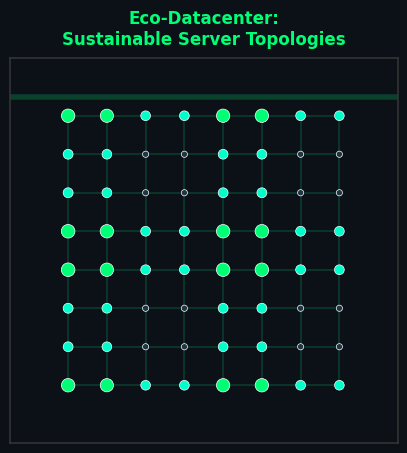
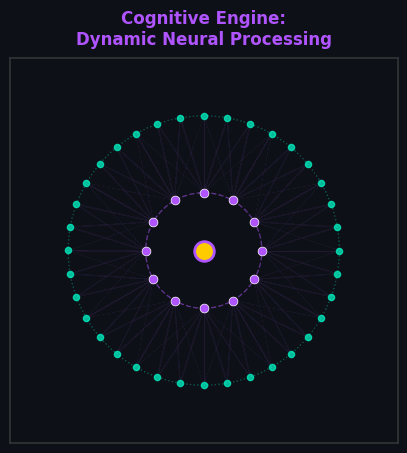
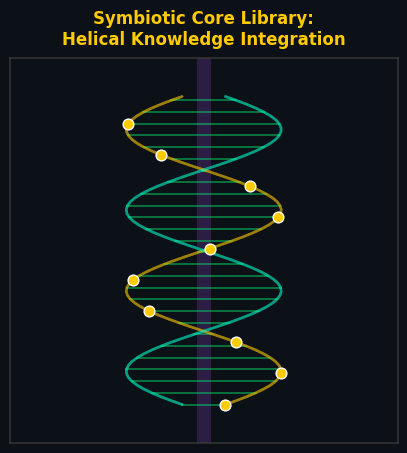

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import io
import base64
from IPython.display import display, HTML
import warnings

# Suppress warnings for clean output
warnings.filterwarnings("ignore")

# ---------------------------------------------------------
# Configuration
# ---------------------------------------------------------
FRAMES = 90
FPS = 30
BG_COLOR = "#0d1117"  # GitHub Dark
ACCENT_1 = "#00ffcc"  # ASI Cyan
ACCENT_3 = "#b055ff"  # Latent Purple
ACCENT_GOLD = "#ffcc00" # Healing/Kintsugi Gold
ACCENT_ECO = "#00ff77"  # Ecology Green

# Set global Seaborn dark theme
sns.set_theme(style="darkgrid", rc={
    "axes.facecolor": BG_COLOR,
    "figure.facecolor": BG_COLOR,
    "axes.edgecolor": "#333333",
    "grid.color": "#222222",
    "text.color": "#e0e0e0",
    "xtick.color": "#e0e0e0",
    "ytick.color": "#e0e0e0"
})

def fig_to_image(fig):
    buf = io.BytesIO()
    fig.savefig(buf, format='png', bbox_inches='tight', facecolor=fig.get_facecolor(), dpi=100)
    buf.seek(0)
    return Image.open(buf).copy()

def image_to_base64(filepath):
    with open(filepath, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode('utf-8')

# ---------------------------------------------------------
# Visualizer 7: eco-datacenter
# ---------------------------------------------------------
def generate_eco_datacenter_gif(filename):
    print("Rendering eco-datacenter GIF...")
    frames = []

    # Create a structured grid of "server nodes"
    grid_size = 8
    x_grid, y_grid = np.meshgrid(np.linspace(-3.5, 3.5, grid_size), np.linspace(-3.5, 3.5, grid_size))
    x_nodes = x_grid.flatten()
    y_nodes = y_grid.flatten()
    n_nodes = len(x_nodes)

    fig, ax = plt.subplots(figsize=(5, 5))

    for i in range(FRAMES):
        ax.clear()

        # Calculate ecological cooling/power waves sweeping across the grid
        wave_phase = i * 0.15
        energy_wave = np.sin(x_nodes * 1.5 - wave_phase) + np.cos(y_nodes * 1.5 - wave_phase)

        node_colors = []
        node_sizes = []

        for j in range(n_nodes):
            # Nodes pulse with energy
            intensity = (energy_wave[j] + 2) / 4 # Normalize 0 to 1

            # Color shifts between base Cyan and ecological Green based on efficiency
            if intensity > 0.6:
                node_colors.append(ACCENT_ECO)
                node_sizes.append(60 + intensity * 40)
            elif intensity > 0.3:
                node_colors.append(ACCENT_1)
                node_sizes.append(40 + intensity * 20)
            else:
                node_colors.append("#223344") # Dark idle state
                node_sizes.append(20)

        # Draw data connections (horizontal/vertical links)
        for j in range(grid_size):
            for k in range(grid_size - 1):
                idx1 = j * grid_size + k
                idx2 = j * grid_size + (k + 1)
                ax.plot([x_nodes[idx1], x_nodes[idx2]], [y_nodes[idx1], y_nodes[idx2]], color=ACCENT_ECO, alpha=0.15, zorder=1)

                idx3 = k * grid_size + j
                idx4 = (k + 1) * grid_size + j
                ax.plot([x_nodes[idx3], x_nodes[idx4]], [y_nodes[idx3], y_nodes[idx4]], color=ACCENT_1, alpha=0.15, zorder=1)

        ax.scatter(x_nodes, y_nodes, c=node_colors, s=node_sizes, edgecolors="#ffffff", linewidths=0.5, zorder=3)

        # Draw a subtle background scanline to simulate monitoring
        scan_y = 4 - ((i % (FRAMES // 2)) / (FRAMES // 2)) * 8
        ax.axhline(scan_y, color=ACCENT_ECO, alpha=0.2, linewidth=4)

        ax.set_xlim(-5, 5)
        ax.set_ylim(-5, 5)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title("Eco-Datacenter:\nSustainable Server Topologies", color=ACCENT_ECO, pad=10, fontweight='bold')

        frames.append(fig_to_image(fig))

    plt.close(fig)
    frames[0].save(filename, save_all=True, append_images=frames[1:], duration=int(1000/FPS), loop=0)
    return filename

# ---------------------------------------------------------
# Visualizer 8: cognitive-engine
# ---------------------------------------------------------
def generate_cognitive_engine_gif(filename):
    print("Rendering cognitive-engine GIF...")
    frames = []

    n_inner = 12
    n_outer = 36

    fig, ax = plt.subplots(figsize=(5, 5))

    for i in range(FRAMES):
        ax.clear()

        # Rotation angles for inner (fast, clockwise) and outer (slow, counter-clockwise) processing rings
        angle_inner = i * 0.1
        angle_outer = -i * 0.03

        theta_inner = np.linspace(0, 2*np.pi, n_inner, endpoint=False) + angle_inner
        theta_outer = np.linspace(0, 2*np.pi, n_outer, endpoint=False) + angle_outer

        r_inner = 1.5 + np.sin(i * 0.2) * 0.2 # Breathing core
        r_outer = 3.5

        x_inner, y_inner = r_inner * np.cos(theta_inner), r_inner * np.sin(theta_inner)
        x_outer, y_outer = r_outer * np.cos(theta_outer), r_outer * np.sin(theta_outer)

        # Draw processing synapses connecting inner to outer based on proximity
        for j in range(n_inner):
            for k in range(n_outer):
                dist = np.sqrt((x_inner[j] - x_outer[k])**2 + (y_inner[j] - y_outer[k])**2)
                if dist < 2.5:
                    intensity = 1 - (dist / 2.5)
                    ax.plot([x_inner[j], x_outer[k]], [y_inner[j], y_outer[k]], color=ACCENT_3, alpha=intensity*0.6, linewidth=1)

        # Draw central engine core
        ax.scatter([0], [0], color=ACCENT_GOLD, s=200 + np.sin(i * 0.4) * 50, edgecolors=ACCENT_3, linewidths=2, zorder=5)

        # Draw rings
        ax.scatter(x_inner, y_inner, color=ACCENT_3, s=40, edgecolors="white", linewidths=0.5, zorder=4)
        ax.scatter(x_outer, y_outer, color=ACCENT_1, s=20, alpha=0.7, zorder=3)

        # Orbiting background data streams
        ax.add_patch(plt.Circle((0, 0), r_outer, color=ACCENT_1, fill=False, linestyle=":", alpha=0.3))
        ax.add_patch(plt.Circle((0, 0), r_inner, color=ACCENT_3, fill=False, linestyle="--", alpha=0.5))

        ax.set_xlim(-5, 5)
        ax.set_ylim(-5, 5)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title("Cognitive Engine:\nDynamic Neural Processing", color=ACCENT_3, pad=10, fontweight='bold')

        frames.append(fig_to_image(fig))

    plt.close(fig)
    frames[0].save(filename, save_all=True, append_images=frames[1:], duration=int(1000/FPS), loop=0)
    return filename

# ---------------------------------------------------------
# Visualizer 9: symbiotic-core-library
# ---------------------------------------------------------
def generate_symbiotic_core_library_gif(filename):
    print("Rendering symbiotic-core-library GIF...")
    frames = []

    n_points = 80
    z_heights = np.linspace(-4, 4, n_points)

    fig, ax = plt.subplots(figsize=(5, 5))

    for i in range(FRAMES):
        ax.clear()

        # Simulate a flowing, double-helix data structure
        phase_shift = i * 0.2

        # Strand 1 (Gold/Library data)
        x1 = np.sin(z_heights * 1.5 - phase_shift) * 2
        y1 = z_heights

        # Strand 2 (Cyan/Active logic)
        x2 = np.sin(z_heights * 1.5 - phase_shift + np.pi) * 2
        y2 = z_heights

        # Draw horizontal bindings (base pairs representing integrated knowledge)
        for j in range(0, n_points, 3):
            ax.plot([x1[j], x2[j]], [y1[j], y2[j]], color=ACCENT_ECO, alpha=0.4, linewidth=1.5, zorder=1)

        # Draw the main strands
        ax.plot(x1, y1, color=ACCENT_GOLD, alpha=0.6, linewidth=2, zorder=2)
        ax.plot(x2, y2, color=ACCENT_1, alpha=0.6, linewidth=2, zorder=2)

        # Floating data packets ascending the library
        packet_indices = [(j + int(i * 0.5)) % n_points for j in range(0, n_points, 8)]
        for idx in packet_indices:
            # Alternate packets between strand 1 and strand 2
            if idx % 2 == 0:
                ax.scatter(x1[idx], y1[idx], color=ACCENT_GOLD, s=60, edgecolors="white", zorder=4)
            else:
                ax.scatter(x2[idx], y2[idx], color=ACCENT_1, s=60, edgecolors="white", zorder=4)

        # Central glowing axis
        ax.axvline(0, color=ACCENT_3, alpha=0.2, linestyle="-", linewidth=10, zorder=0)

        ax.set_xlim(-5, 5)
        ax.set_ylim(-5, 5)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title("Symbiotic Core Library:\nHelical Knowledge Integration", color=ACCENT_GOLD, pad=10, fontweight='bold')

        frames.append(fig_to_image(fig))

    plt.close(fig)
    frames[0].save(filename, save_all=True, append_images=frames[1:], duration=int(1000/FPS), loop=0)
    return filename

# ---------------------------------------------------------
# Execution & Display
# ---------------------------------------------------------
file_eco = generate_eco_datacenter_gif('eco_datacenter.gif')
file_engine = generate_cognitive_engine_gif('cognitive_engine.gif')
file_library = generate_symbiotic_core_library_gif('symbiotic_core_library.gif')

b64_eco = image_to_base64(file_eco)
b64_engine = image_to_base64(file_engine)
b64_library = image_to_base64(file_library)

print("Displaying Ecosystem Architecture Trio...")

html_code_2 = f"""
<div style="display: flex; gap: 20px; flex-wrap: wrap; justify-content: center; font-family: 'Courier New', monospace; color: white; margin-top: 20px;">

    <div style="text-align: center; width: 30%;">
        <h3 style="color: {ACCENT_ECO}; font-size: 14px; margin-bottom: 5px;">eco-datacenter</h3>
        <p style="font-size: 10px; color: #888; height: 50px;">A hyper-efficient hardware grid. Power flows in sustainable waves, dynamically allocating resources and lighting up active nodes while keeping idle states cool.</p>
        <img src="data:image/gif;base64,{b64_eco}" style="border: 1px solid #333; border-radius: 8px; width: 100%;">
    </div>

    <div style="text-align: center; width: 30%;">
        <h3 style="color: {ACCENT_3}; font-size: 14px; margin-bottom: 5px;">cognitive-engine</h3>
        <p style="font-size: 10px; color: #888; height: 50px;">The central logic processor. Counter-rotating synaptic rings constantly measure spatial data, firing dynamic connections to a pulsing, analytical core.</p>
        <img src="data:image/gif;base64,{b64_engine}" style="border: 1px solid #333; border-radius: 8px; width: 100%;">
    </div>

    <div style="text-align: center; width: 30%;">
        <h3 style="color: {ACCENT_GOLD}; font-size: 14px; margin-bottom: 5px;">symbiotic-core-library</h3>
        <p style="font-size: 10px; color: #888; height: 50px;">The unified knowledge base. Information spirals in a DNA-like double helix, weaving raw data and refined logic together into a permanent, accessible structure.</p>
        <img src="data:image/gif;base64,{b64_library}" style="border: 1px solid #333; border-radius: 8px; width: 100%;">
    </div>

</div>
"""

display(HTML(html_code_2))